#                                Housing Prices Database Management

This file contains all the queries for Views, Use Cases and Functions.

VIEWS:

1. List the model id, run time in seconds and the default and actual values for the hyper parameter nbins for the GBM algorithm for the run time 1000.

CREATE 
    ALGORITHM = UNDEFINED 
    DEFINER = `root`@`localhost` 
    SQL SECURITY DEFINER
VIEW `v_gbm_nbins` AS
    SELECT 
        `mt`.`model_id` AS `model_id`,
        `mm`.`run_time_sec` AS `run_time_sec`,
        `hp`.`hyper_parameter` AS `hyper_parameter`,
        `hpv`.`hyper_actual` AS `hyper_actual`,
        `hpv`.`hyper_default` AS `hyper_default`
    FROM
        (((`model_table` `mt`
        JOIN `model_meta_data` `mm` ON ((`mt`.`id` = `mm`.`model_id`)))
        JOIN `hyper_parameter_table` `hp` ON ((`mt`.`id` = `hp`.`model_id`)))
        JOIN `hyper_parameter_values` `hpv` ON ((`hp`.`id` = `hpv`.`hyper_id`)))
    WHERE
        ((`hp`.`hyper_parameter` = 'nbins')
            AND (`mm`.`run_time_sec` = 1000)
            AND (`mt`.`model_id` LIKE '%GBM%'))

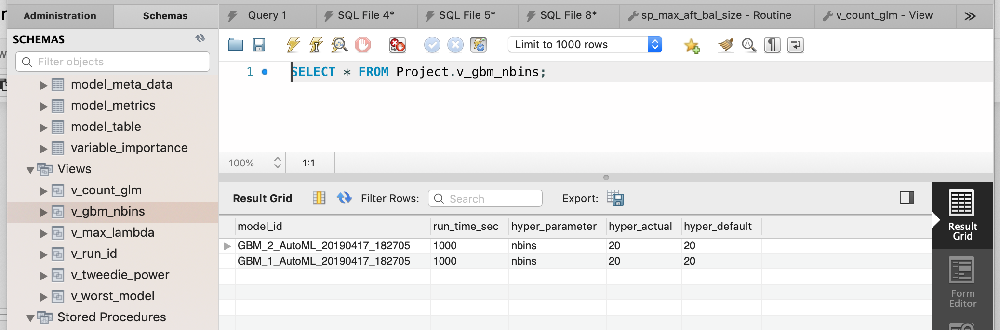

2. List the maximum value for the lambda hyperparameter for GLM algorithm.

CREATE 
    ALGORITHM = UNDEFINED 
    DEFINER = `root`@`localhost` 
    SQL SECURITY DEFINER
VIEW `v_max_lambda` AS
    SELECT 
        MAX(`hpv`.`hyper_actual`) AS `max_lambda`
    FROM
        (`hyper_parameter_values` `hpv`
        JOIN `hyper_parameter_table` `hp` ON ((`hpv`.`hyper_id` = `hp`.`id`)))
    WHERE
        (`hp`.`hyper_parameter` = 'lambda')

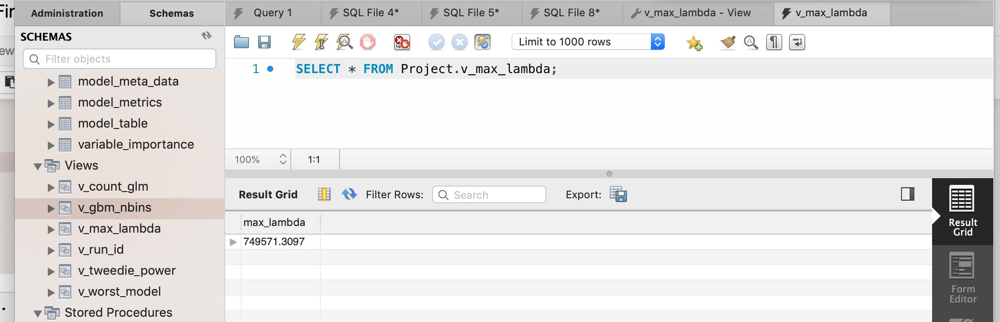

3. List all the model id along with its run time in seconds for the run id 6tGKlAAzz.

CREATE 
    ALGORITHM = UNDEFINED 
    DEFINER = `root`@`localhost` 
    SQL SECURITY DEFINER
VIEW `v_run_id` AS
    SELECT 
        `mt`.`model_id` AS `model_id`,
        `mm`.`run_time_sec` AS `run_time_sec`
    FROM
        (`model_table` `mt`
        JOIN `model_meta_data` `mm` ON ((`mt`.`id` = `mm`.`model_id`)))
    WHERE
        (`mm`.`run_id` = '6tGKlAAzz')

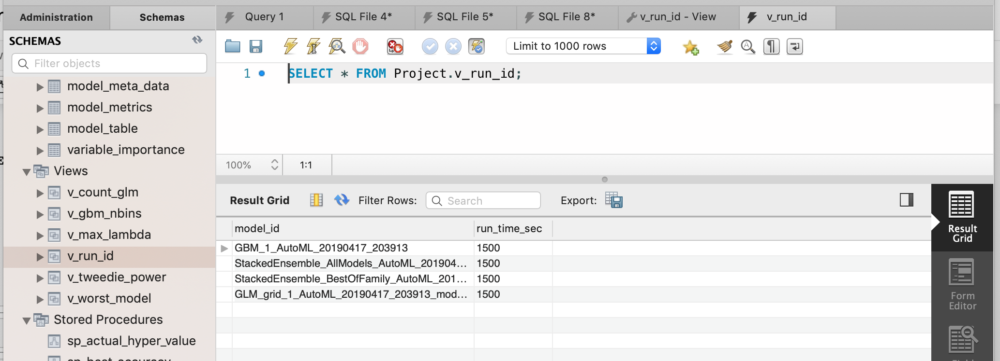

4. List the model id and run time in seconds for the hyper parameter tweedie_power with actual value as 1.5 for the GBM algorithm.

CREATE 
    ALGORITHM = UNDEFINED 
    DEFINER = `root`@`localhost` 
    SQL SECURITY DEFINER
VIEW `v_tweedie_power` AS
    SELECT 
        `mt`.`model_id` AS `model_id`,
        `mm`.`run_time_sec` AS `run_time_sec`,
        `hp`.`hyper_parameter` AS `hyper_parameter`,
        `hpv`.`hyper_actual` AS `hyper_actual`
    FROM
        (((`model_table` `mt`
        JOIN `model_meta_data` `mm` ON ((`mt`.`id` = `mm`.`model_id`)))
        JOIN `hyper_parameter_table` `hp` ON ((`mt`.`id` = `hp`.`model_id`)))
        JOIN `hyper_parameter_values` `hpv` ON ((`hp`.`id` = `hpv`.`hyper_id`)))
    WHERE
        ((`hp`.`hyper_parameter` = 'tweedie_power')
            AND (`hpv`.`hyper_actual` = 1.5))

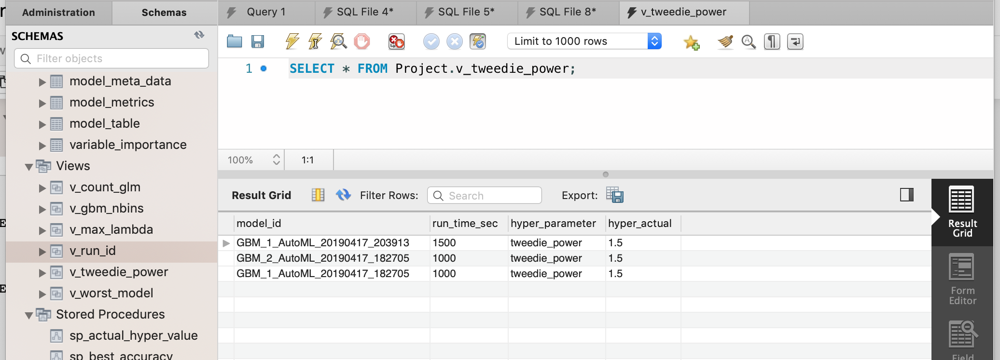

5. List the model id along with its run time in seconds with its model metrics data which has the accuracy is very low. 

CREATE 
    ALGORITHM = UNDEFINED 
    DEFINER = `root`@`localhost` 
    SQL SECURITY DEFINER
VIEW `v_worst_model` AS
    SELECT 
        `mt`.`model_id` AS `model_id`,
        `mmd`.`run_time_sec` AS `run_time_sec`,
        `mm`.`rmse` AS `rmse`,
        `mm`.`mse` AS `mse`,
        `mm`.`mae` AS `mae`,
        `mm`.`rmsle` AS `rmsle`
    FROM
        ((((`model_table` `mt`
        JOIN `model_meta_data` `mmd` ON ((`mt`.`id` = `mmd`.`model_id`)))
        JOIN `hyper_parameter_table` `hp` ON ((`mt`.`id` = `hp`.`model_id`)))
        JOIN `hyper_parameter_values` `hpv` ON ((`hp`.`id` = `hpv`.`hyper_id`)))
        JOIN `model_metrics` `mm` ON ((`mm`.`model_id` = `mt`.`id`)))
    WHERE
        (`mm`.`rmse` = (SELECT 
                MAX(`model_metrics`.`rmse`)
            FROM
                `model_metrics`))
    LIMIT 1

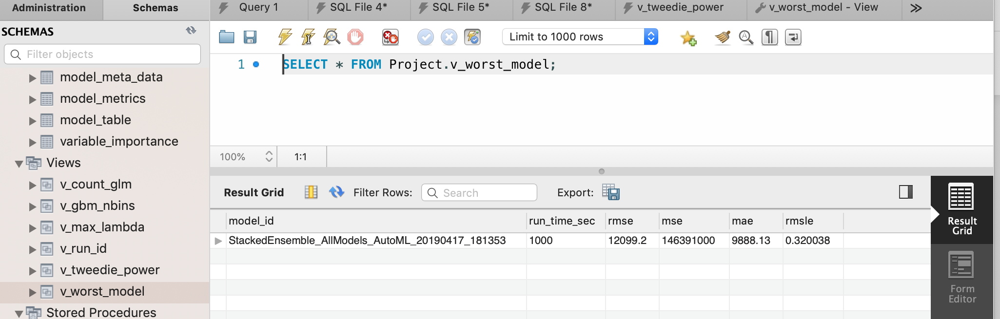

6. List the number of models generated for a particular algorithm "GLM". 

CREATE 
    ALGORITHM = UNDEFINED 
    DEFINER = `root`@`localhost` 
    SQL SECURITY DEFINER
VIEW `v_count_glm` AS
    SELECT 
        COUNT(`model_table`.`model_id`) AS `COUNT(model_id)`
    FROM
        `model_table`
    WHERE
        (`model_table`.`model_id` LIKE '%GLM%')

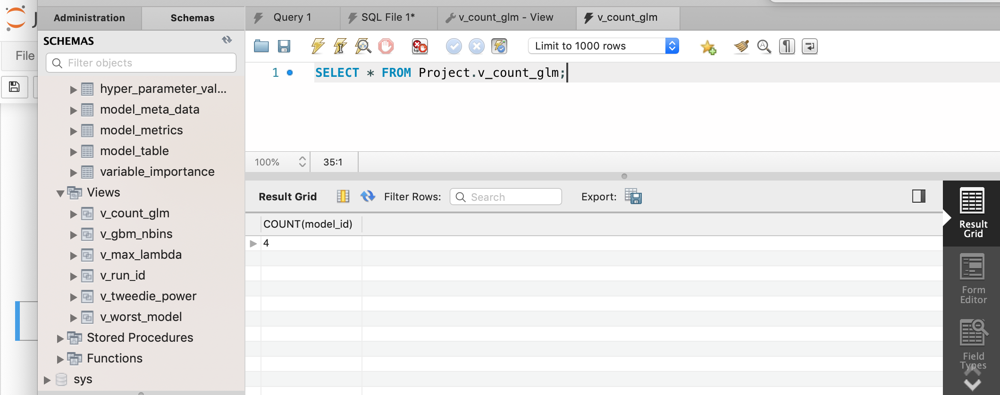

USE CASES:

1. What should be the default value for max_after_balance_size if the data frame size increases when dealing with unbalanced data.


SELECT mt.model_id,mm.run_time_sec,hpv.hyper_actual,hpv.hyper_default FROM model_table mt INNER JOIN 
model_meta_data mm ON mt.id = mm.model_id INNER JOIN hyper_parameter_table hp ON
mt.id = hp.model_id INNER JOIN hyper_parameter_values hpv ON hp.id = hpv.hyper_id 
WHERE hp.hyper_parameter = "max_after_balance_size";

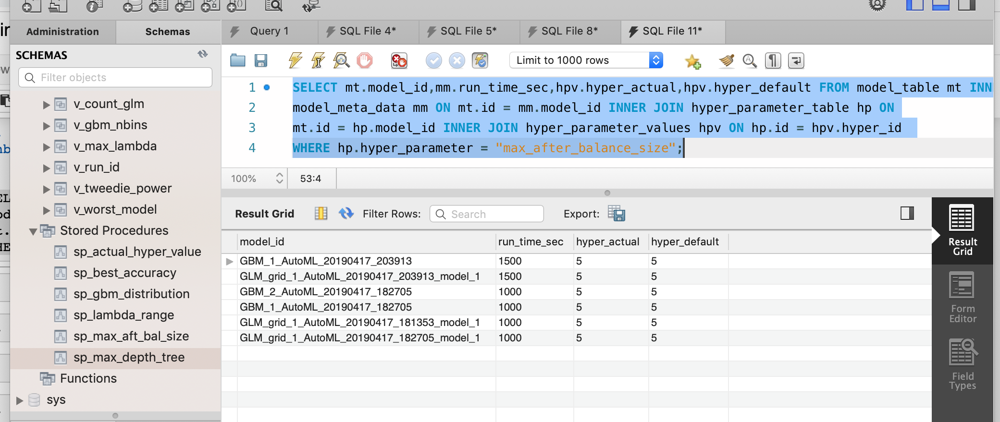

2.  List all the hyperparameters based on the model GLM for particular run time 1000.

SELECT mt.model_id, hp.hyper_parameter,hpv.hyper_default,
hpv.hyper_actual FROM model_table mt INNER JOIN model_meta_data mm ON
mt.id = mm.model_id INNER JOIN hyper_parameter_table hp ON
mt.id = hp.model_id INNER JOIN hyper_parameter_values hpv ON
hpv.hyper_id = hp.id WHERE hp.hyper_parameter IN('seed','tweedie_link_power',
'alpha','lambda','standardize','missing_values_handling','max_iterations',
'balance_classes','max_after_balance_size','max_runtime_secs') AND 
mt.model_id like '%GLM%' and mm.run_time_sec = 1000;

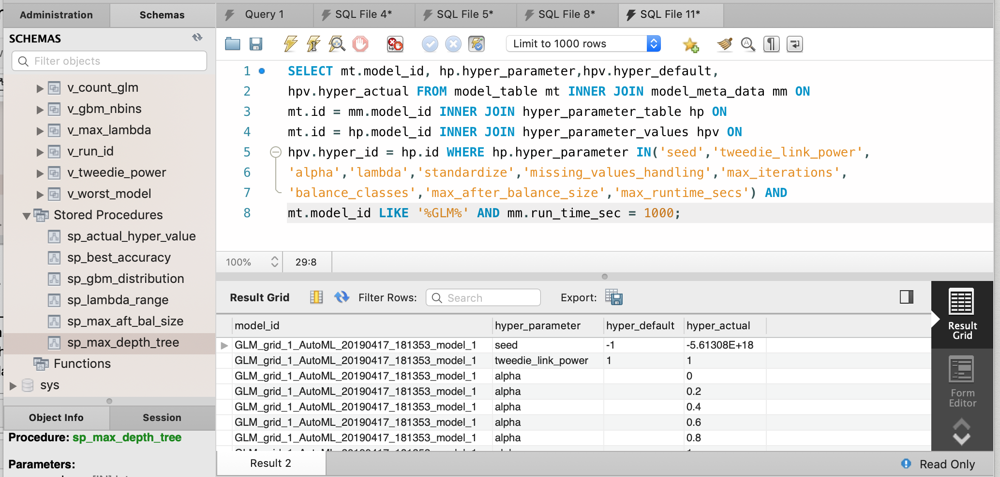

3.  List out the average error efficiency for a particular run time = 1500.


SELECT (SELECT AVG(rmse) from model_metrics) as average_accuracy
FROM model_table mt INNER JOIN model_meta_data mmd ON mt.id = mmd.model_id 
INNER JOIN hyper_parameter_table hp ON mt.id = hp.model_id 
INNER JOIN hyper_parameter_values hpv ON hp.id = hpv.hyper_id
INNER JOIN model_metrics mm ON mm.model_id = mt.id 
WHERE mmd.run_time_sec = 1500 LIMIT 1; 

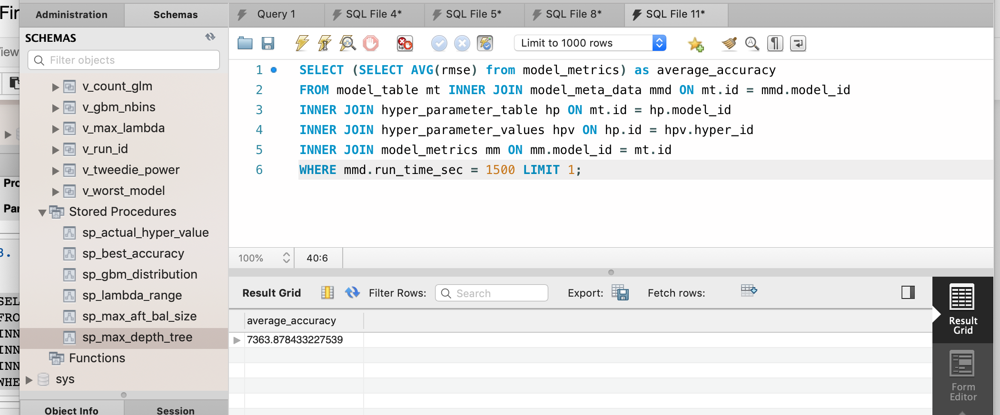

4.  Give the range of the hyperparameter alpha for GLM for run time 1000.

SELECT MIN(hpv.hyper_actual) AS min_alpha,
MAX(hpv.hyper_actual) AS max_alpha, 
(MAX(hpv.hyper_actual) - MIN(hpv.hyper_actual)) AS alpha_range
from model_table mt INNER JOIN model_meta_data mm ON
mt.id = mm.model_id INNER JOIN hyper_parameter_table hp ON
mt.id = hp.model_id INNER JOIN hyper_parameter_values hpv ON
hpv.hyper_id = hp.id WHERE hp.hyper_parameter = 'alpha' AND 
mt.model_id like '%GLM%' AND mm.run_time_sec = 1000;

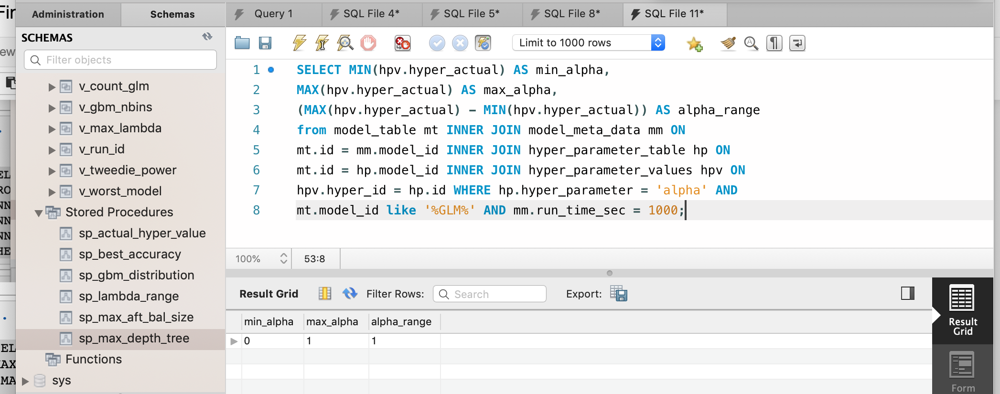

5. Which models hyperparameter has the tweedie_link_power has 1.0.

SELECT mt.model_id,mm.run_id,mm.system_date,mm.run_time_sec FROM model_table mt
INNER JOIN model_meta_data mm ON mt.id = mm.model_id INNER JOIN hyper_parameter_table hp
on mt.id = hp.model_id INNER JOIN hyper_parameter_values hpv ON hp.id = hpv.hyper_id
WHERE  hp.hyper_parameter = 'tweedie_link_power' AND hpv.hyper_actual = 1.0;

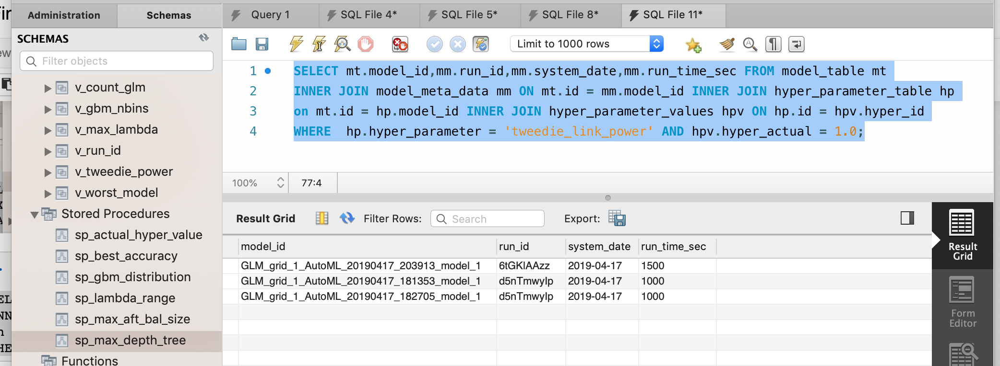

6.List the maximum value for lambda hyperparameter with its run time for the GBM model.



select mt.model_id, mm.run_time_sec, hp.hyper_parameter,
hpv.hyper_actual from model_table mt INNER JOIN model_meta_data mm ON mt.id = mm.model_id INNER JOIN hyper_parameter_table hp ON mt.id = hp.model_id INNER JOIN hyper_parameter_values hpv ON
hpv.hyper_id = hp.id WHERE  mt.model_id like '%GLM%' and 
hpv.hyper_actual = (select MAX(hyper_actual) 
from hyper_parameter_values hpv INNER JOIN hyper_parameter_table hp
on hpv.hyper_id = hp.id where hp.hyper_parameter = 'lambda');


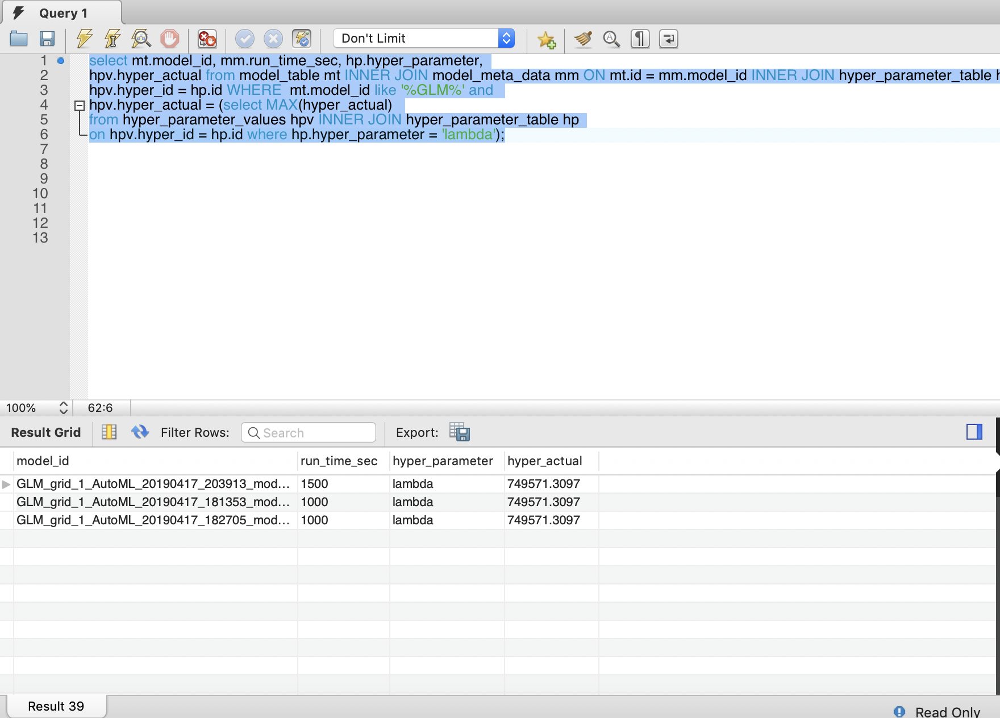

7.List all the models that was run on a particular date.




select mt.model_id,mm.run_time_sec,mm.run_id from model_table mt inner join 
model_meta_data mm ON mt.id = mm.model_id where system_date = '2019/04/17';

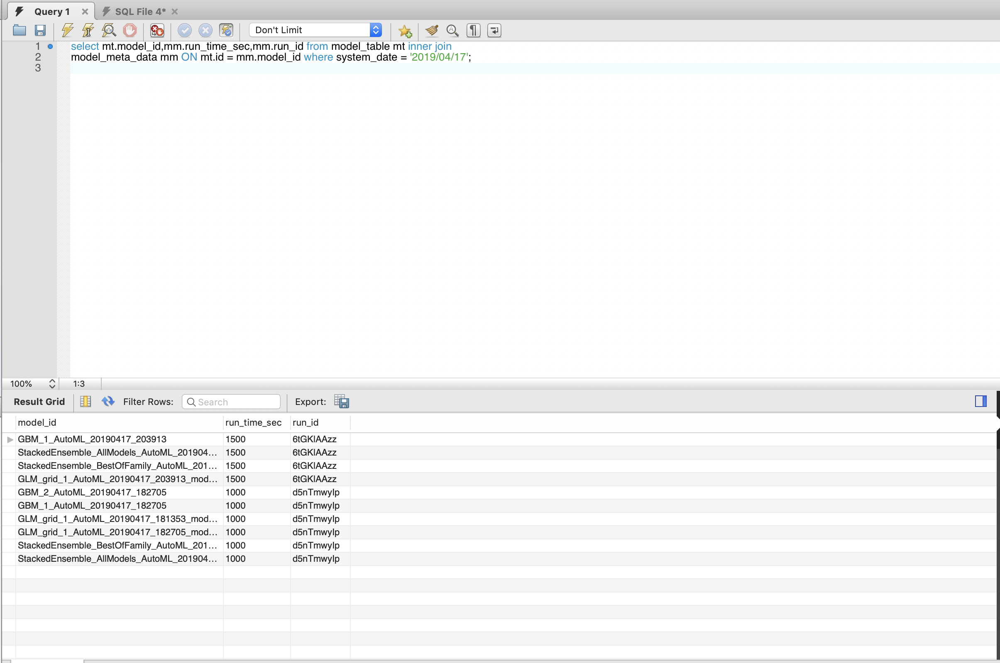

8.List out the least and maximum rmse value for a particular model.



SELECT MIN(mm.rmse) as min_rmse,MAX(rmse) as max_rmse FROM model_table mt 
INNER JOIN model_meta_data mmd ON mt.id = mmd.model_id INNER JOIN hyper_parameter_table hp 
ON mt.id = hp.model_id INNER JOIN hyper_parameter_values hpv ON hp.id = hpv.hyper_id
INNER JOIN model_metrics mm ON mm.model_id = mt.id WHERE mt.model_id like "%GBM%" and run_time_sec= 1000;


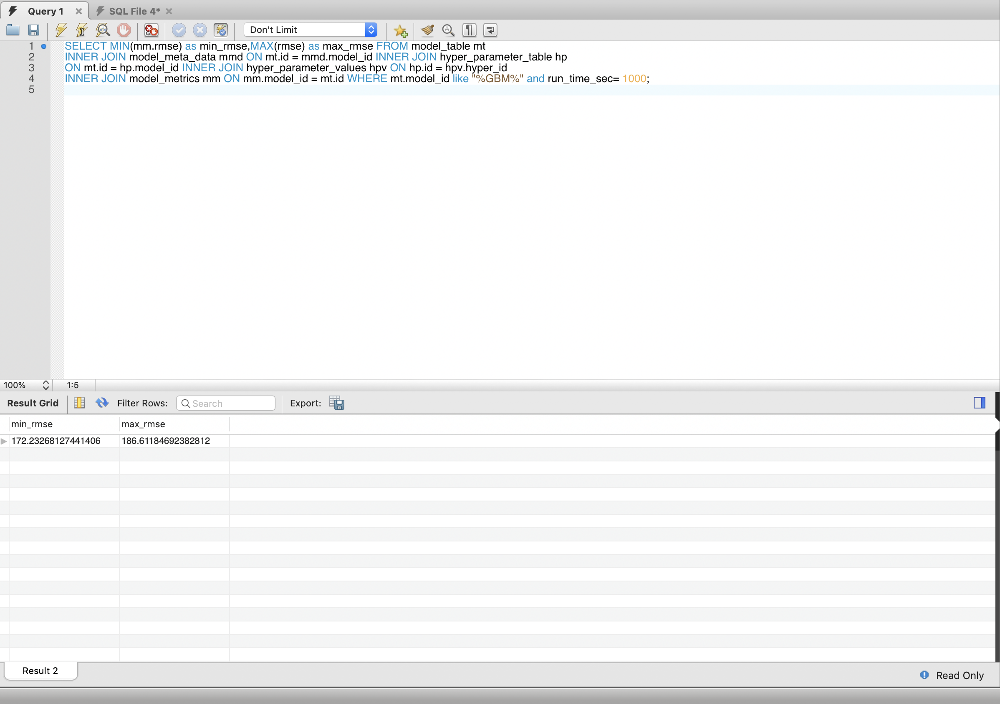

9.List the number of trees, depth of trees, learning rate with actual and default values for a particular model with its run time for GBM model





select mt.model_id, mm.run_time_sec, hp.hyper_parameter,hpv.hyper_default,
hpv.hyper_actual from model_table mt INNER JOIN model_meta_data mm ON
mt.id = mm.model_id INNER JOIN hyper_parameter_table hp ON
mt.id = hp.model_id INNER JOIN hyper_parameter_values hpv ON
hpv.hyper_id = hp.id WHERE hp.hyper_parameter IN('learn_rate','ntrees','max_depth') AND 
mt.model_id like '%GBM%'; 

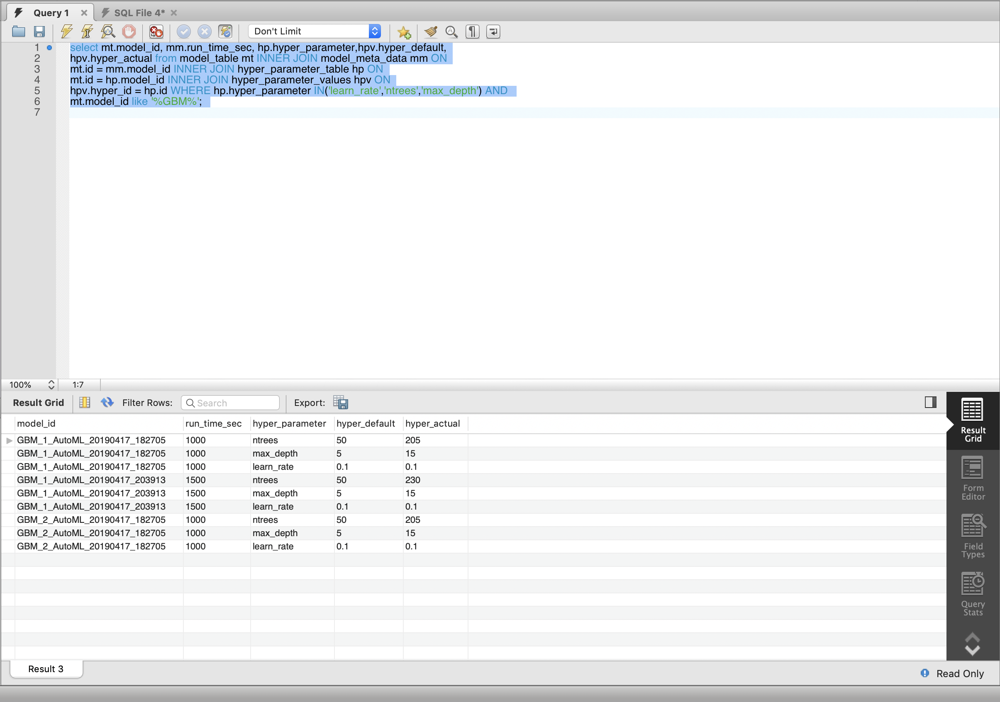

10.Find the best model for any run time based on the rmse value .





SELECT mt.model_id,mmd.run_time_sec,(SELECT MIN(rmse) from model_metrics) as best_accuracy
FROM model_table mt INNER JOIN model_meta_data mmd ON mt.id = mmd.model_id 
INNER JOIN hyper_parameter_table hp ON mt.id = hp.model_id 
INNER JOIN hyper_parameter_values hpv ON hp.id = hpv.hyper_id
INNER JOIN model_metrics mm ON mm.model_id = mt.id LIMIT 1;

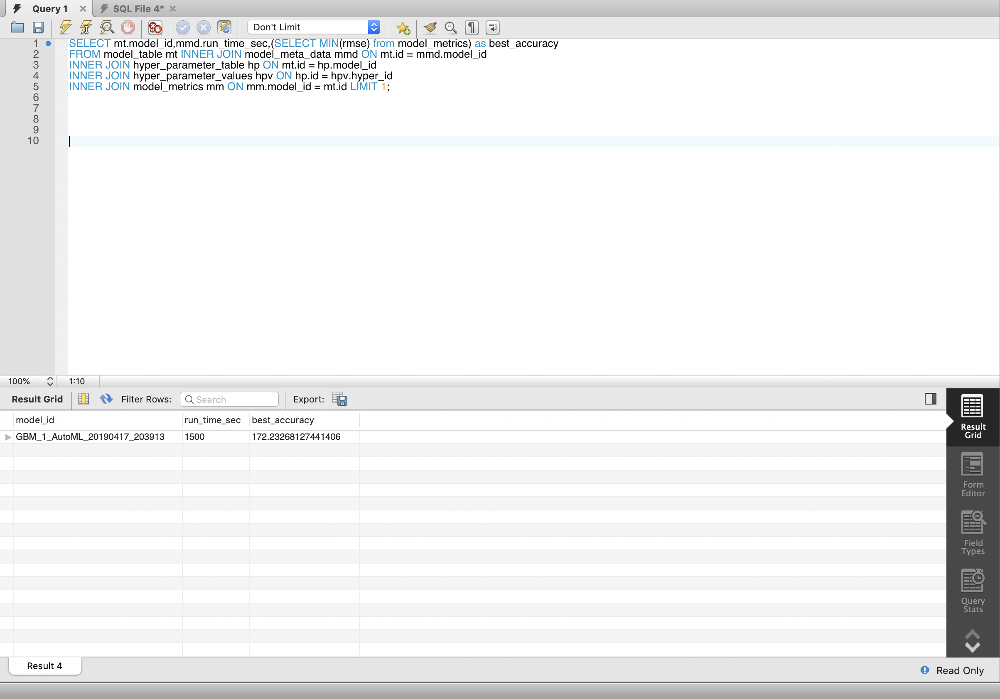

USE CASES:

1. List of all models that was run on a particular run id

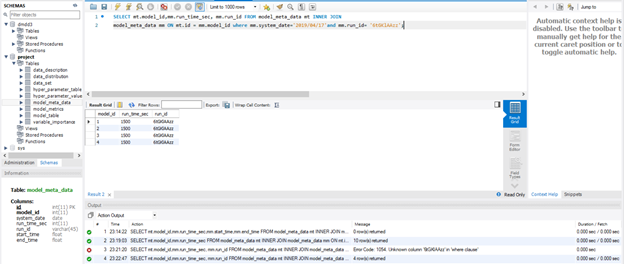

2.Error efficiency of run=1000

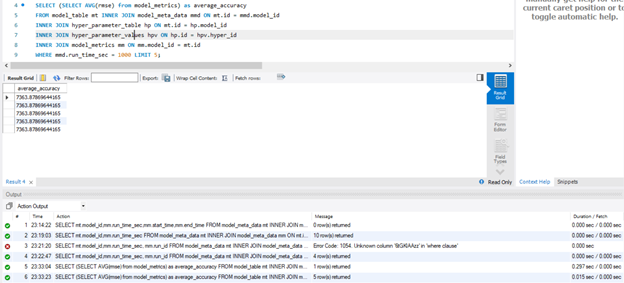

3.List of all the hyperparameter and their actual value for a particular model

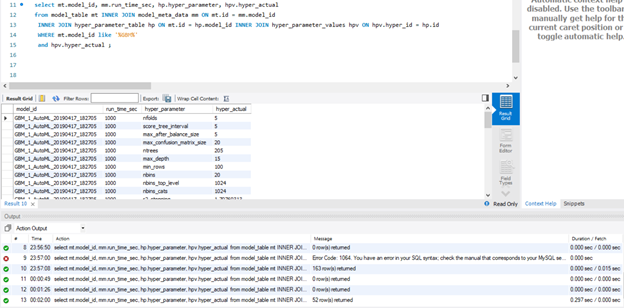

4.List of hyperparameter , runtime and their values of a particular model

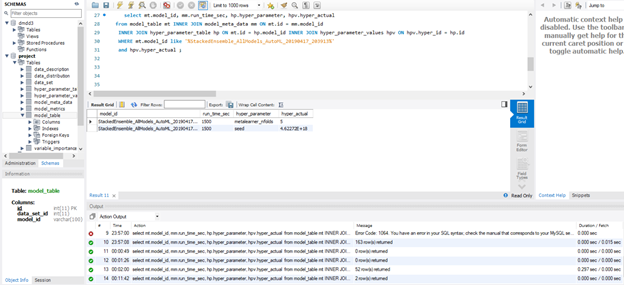

5. List the runtime of StackedEnsemble_AllModels_AutoML_20190417_203913

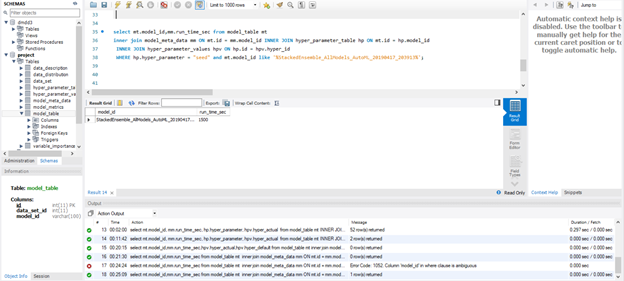

Functions:-

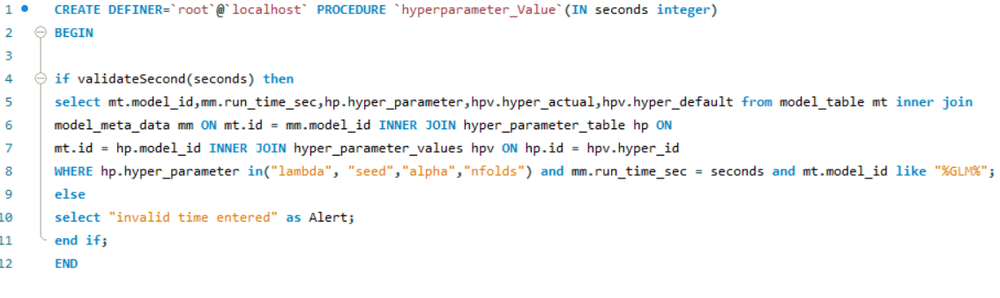

1. 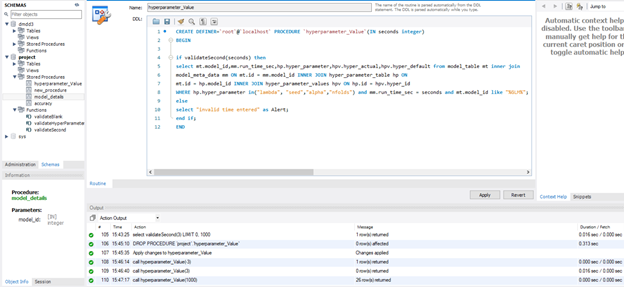

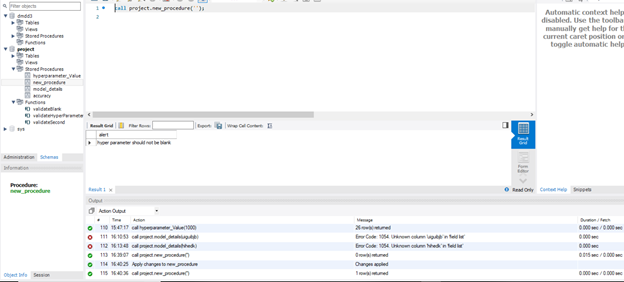

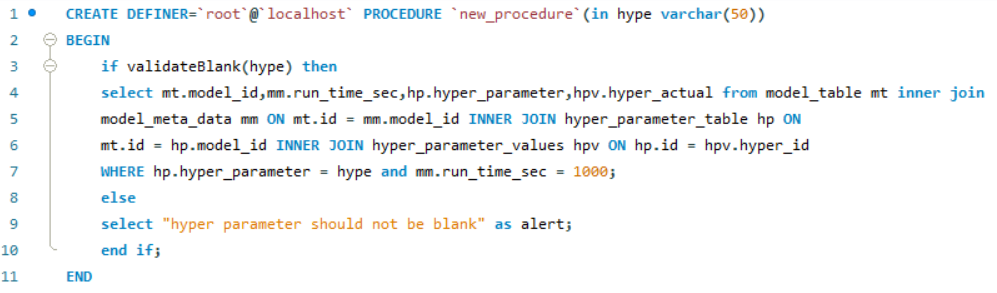

2.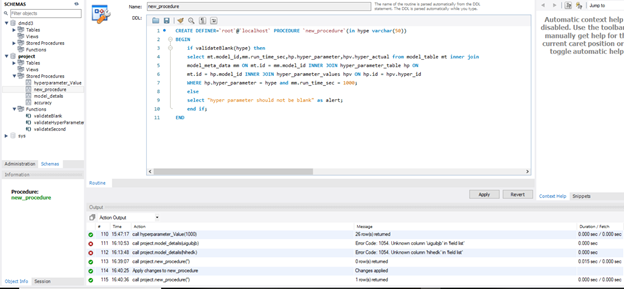

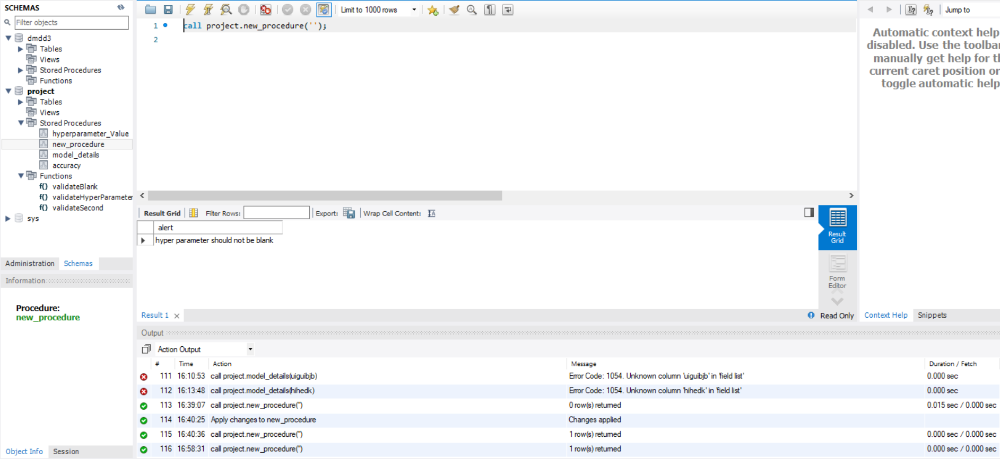

3.  CREATE DEFINER=`root`@`localhost` FUNCTION `func_1`(rmse int) RETURNS text CHARSET utf8mb4
    DETERMINISTIC
    BEGIN
    declare t text;
    if rmse < 200 then
    set t = 'best';
    else
    set t = 'average';
    end if;
    RETURN (t);
    END

    select rmse,func_1(rmse) as error_accuracy from model_metrics;

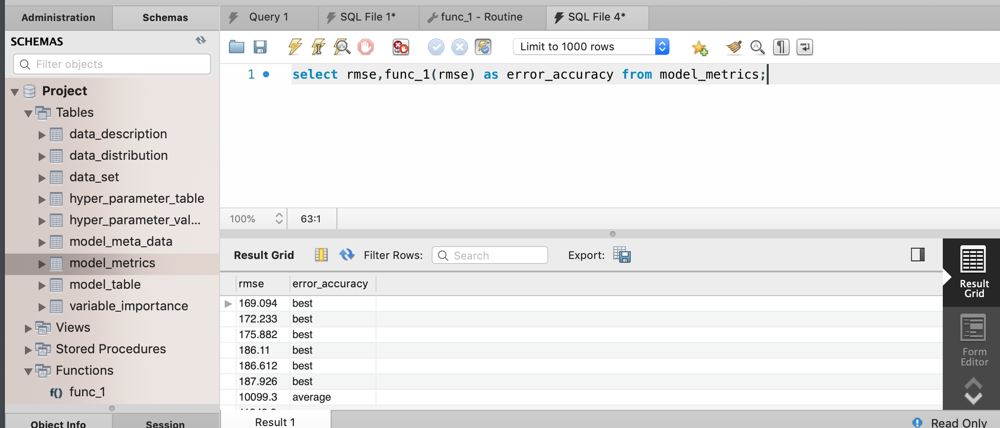

4.CREATE DEFINER=`root`@`localhost` FUNCTION `validateHyperParameter`(valuepassed varchar(30)) RETURNS tinyint(1)
    DETERMINISTIC
BEGIN
IF  lower(valuepassed)="lambda" or lower(valuepassed)="seed" or lower(valuepassed)="alpha" or lower(valuepassed)="nfolds" then
 return true;
 end if;
return false;
end

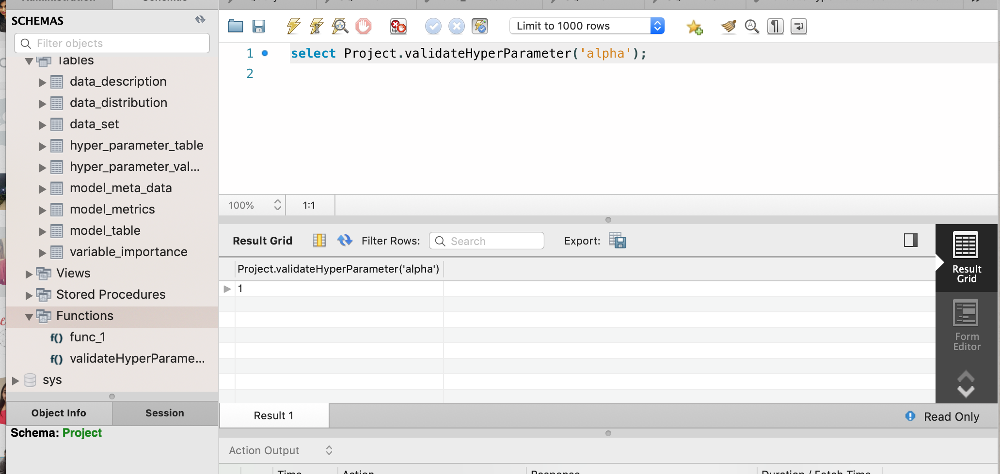

5.CREATE DEFINER=`root`@`localhost` FUNCTION `validateBlank`(valuepassed varchar(30)) RETURNS tinyint(1)
    DETERMINISTIC
BEGIN
IF length(trim(valuepassed))=0  or (isnull(valuepassed)) then
 return false;
 end if;
return true;
end

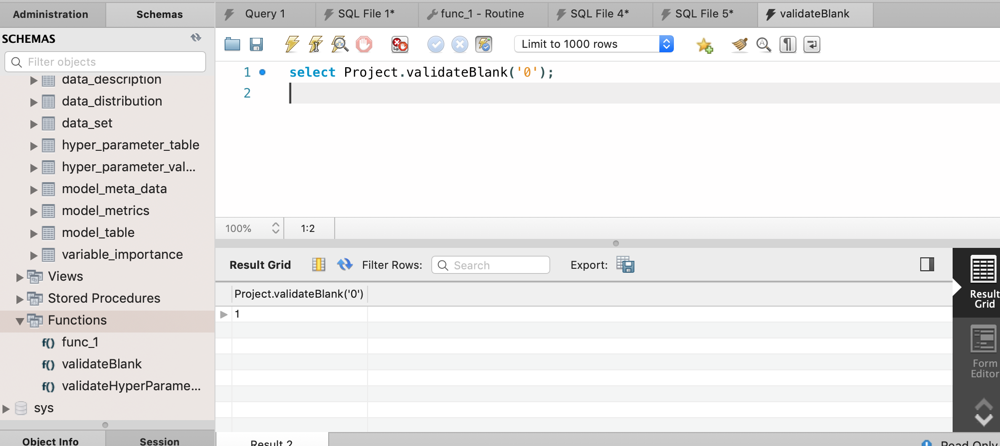